In [1]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
from td_utils import *
%matplotlib inline

C:\Users\Debroop\AppData\Local\Programs\Python\Python311\Lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [2]:
IPython.display.Audio("audio_examples/example_train.wav")

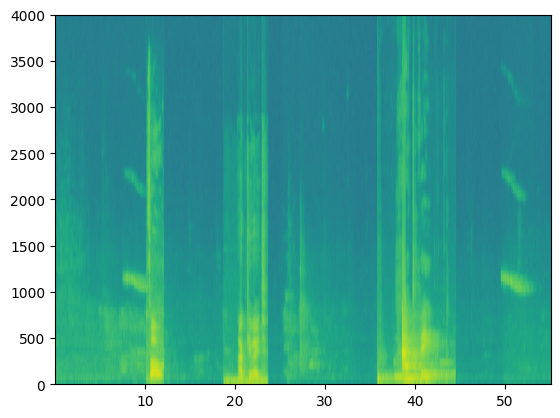

In [3]:
x = graph_spectrogram("audio_examples/example_train.wav")

In [4]:
_, data = wavfile.read("audio_examples/example_train.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrogram (101, 5511)


In [5]:
Tx = 5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram
Ty = 1375 # The number of time steps in the output of our model

In [6]:
 activates, negatives, backgrounds = load_raw_audio('./raw_data/')

print("background len should be 10,000, since it is a 10 sec clip\n" + str(len(backgrounds[0])),"\n")
print("activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) \n" + str(len(activates[0])),"\n")
print("activate[1] len: different `activate` clips can have different lengths\n" + str(len(activates[1])),"\n")

background len should be 10,000, since it is a 10 sec clip
10000 

activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) 
721 

activate[1] len: different `activate` clips can have different lengths
731 



In [7]:
def get_random_time_segment(segment_ms):
    segment_start = np.random.randint(low=0, high=10000-segment_ms)   
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

In [8]:
def is_overlapping(segment_time, previous_segments):
    segment_start, segment_end = segment_time
    overlap = False
    for previous_start, previous_end in previous_segments:
        if previous_end>= segment_start and previous_start<= segment_end:
            overlap = True
            break
    return overlap

In [9]:
def insert_audio_clip(background, audio_clip, previous_segments):
    segment_ms = len(audio_clip)
    segment_time = get_random_time_segment(segment_ms)
    retry = 5 
    while is_overlapping(segment_time, previous_segments) and retry >= 0:
        segment_time = get_random_time_segment(segment_ms)
        retry = retry - 1
    if not is_overlapping(segment_time, previous_segments):
        previous_segments.append(segment_time)
        new_background = background.overlay(audio_clip, position = segment_time[0])
    else:
        new_background = background
        segment_time = (10000, 10000)
    return new_background, segment_time

In [10]:
def insert_ones(y, segment_end_ms):
    _, Ty = y.shape
    
    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    
    if segment_end_y < Ty:
        # Add 1 to the correct index in the background label (y)
        for i in range(segment_end_y+1, segment_end_y+51):
            if  i< Ty:
                y[0, i] = 1
    return y

In [11]:
def create_training_example(background, activates, negatives, Ty):
    background = background - 20

   
    # Initialize y (label vector) of zeros 
    y = np.zeros((1,Ty))

    # Initialize segment times as empty list
    previous_segments = []
    # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    # Loop over randomly selected "activate" clips and insert in background
    for one_random_activate in random_activates:
        # Insert the audio clip on the background
        background, segment_time = insert_audio_clip(background, one_random_activate, previous_segments)
        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time
        # Insert labels in "y" at segment_end
        y = insert_ones(y, segment_end)
     # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]
    # Loop over randomly selected negative clips and insert in background
    for random_negative in random_negatives:
        # Insert the audio clip on the background 
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)

    # Export new training example 
    file_handle = background.export("train" + ".wav", format="wav")
    
    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("train.wav")
    
    return x, y

In [12]:
IPython.display.Audio("train.wav")
IPython.display.Audio("audio_examples/train_reference.wav")

0
10
20
30


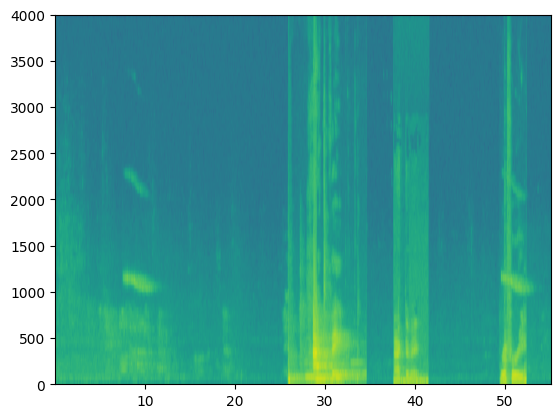

In [13]:
np.random.seed(4543)
nsamples = 32
X = []
Y = []
for i in range(0, nsamples):
    if i%10 == 0:
        print(i)
    x, y = create_training_example(backgrounds[i % 2], activates, negatives, Ty)
    X.append(x.swapaxes(0,1))
    Y.append(y.swapaxes(0,1))
X = np.array(X)
Y = np.array(Y)

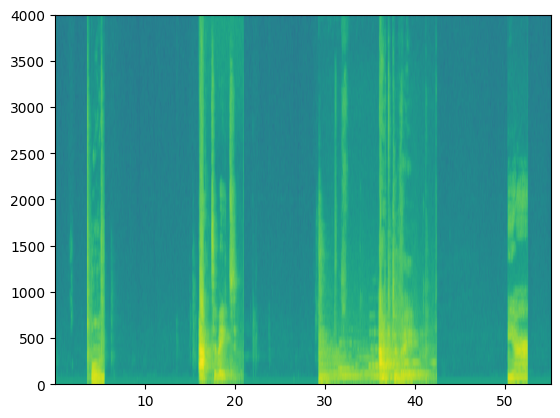

In [14]:
np.random.seed(18)
x, y = create_training_example(backgrounds[0], activates, negatives, Ty)

In [15]:
# Load preprocessed dev set examples
X_dev = np.load("./XY_dev/X_dev.npy")
Y_dev = np.load("./XY_dev/Y_dev.npy")

In [16]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from tensorflow.keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam

In [17]:
def modelf(input_shape):
    X_input = Input(shape = input_shape)
    
    # CONV layer
    # Conv1D with 196 units, kernel size of 15 and stride of 4
    X = Conv1D(filters= 196, kernel_size=15, strides=4)(X_input)
    # Batch normalization
    X = BatchNormalization()(X)
    # ReLu activation
    X = Activation('relu')(X)
    # dropout
    X = Dropout(0.8)(X)                                 

    # First GRU Layer (≈4 lines)
    # GRU (128 units and return the sequences)
    X = GRU(units=128, return_sequences= True)(X)
    # dropout
    X = Dropout(0.8)(X)
    # Batch normalization.
    X = BatchNormalization()(X)                 
    
    # Second GRU Layer 
    # GRU (128 units and return the sequences)
    X = GRU(units=128, return_sequences=True)(X)
    # dropout
    X = Dropout(0.8)(X)
    # Time-distributed dense layer 
    # TimeDistributed  with sigmoid activation 
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X) 

    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [18]:
model = modelf(input_shape = (Tx, n_freq))
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 5511, 101)]       0         
                                                                 
 conv1d (Conv1D)             (None, 1375, 196)         297136    
                                                                 
 batch_normalization (BatchN  (None, 1375, 196)        784       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 1375, 196)         0         
                                                                 
 dropout (Dropout)           (None, 1375, 196)         0         
                                                                 
 gru (GRU)                   (None, 1375, 128)         125184    
                                                             

In [19]:
from tensorflow.keras.models import model_from_json

json_file = open('./models/model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
model.load_weights('./models/model.h5')

In [20]:
model.layers[2].trainable = False
model.layers[7].trainable = False
model.layers[10].trainable = False

In [21]:
opt = Adam(learning_rate=1e-6, beta_1=0.9, beta_2=0.999)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [22]:
model.fit(X, Y, batch_size = 16, epochs=2)

Epoch 1/2
2/2 [==============================] - 4s 992ms/step - loss: 0.1874 - accuracy: 0.9399
Epoch 2/2
2/2 [==============================] - 2s 1s/step - loss: 0.1922 - accuracy: 0.9366


In [23]:
oss, acc, = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

1/1 [==============================] - 1s 977ms/step - loss: 0.1889 - accuracy: 0.9238
Dev set accuracy =  0.9238108992576599


In [24]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)
    
    # Correct the amplitude of the input file before prediction 
    audio_clip = AudioSegment.from_wav(filename)
    audio_clip = match_target_amplitude(audio_clip, -20.0)
    file_handle = audio_clip.export("tmp.wav", format="wav")
    filename = "tmp.wav"

    x = graph_spectrogram(filename)
    # the spectrogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

In [25]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    # Initialize the number of consecutive output steps to 0
    consecutive_timesteps = 0
    i = 0
    # Loop over the output steps in the y
    while i < Ty:
        # Increment consecutive output steps
        consecutive_timesteps += 1
        # If prediction is higher than the threshold for 20 consecutive output steps have passed
        if consecutive_timesteps > 20:
            # Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds) * 1000)
            # Reset consecutive output steps to 0
            consecutive_timesteps = 0
            i = 75 * (i // 75 + 1)
            continue
        # if amplitude is smaller than the threshold reset the consecutive_timesteps counter
        if predictions[0, i, 0] < threshold:
            consecutive_timesteps = 0
        i += 1
        
    audio_clip.export("chime_output.wav", format='wav')

1/1 [==============================] - 1s 532ms/step


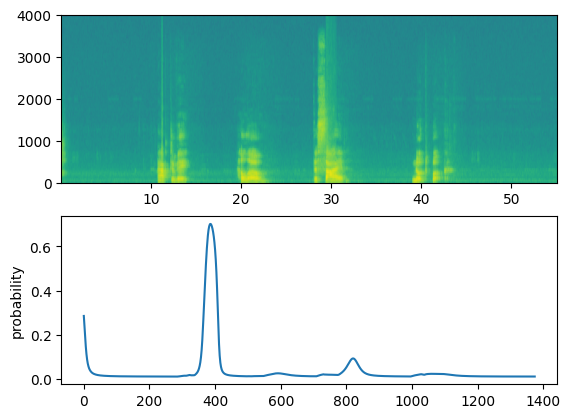

In [26]:
filename = "./raw_data/dev/1.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

1/1 [==============================] - 0s 100ms/step


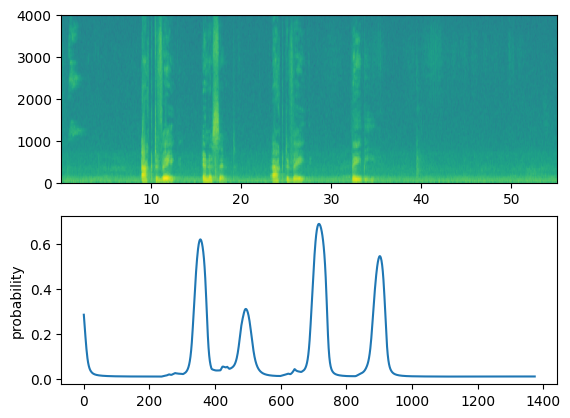

In [27]:
filename  = "./raw_data/dev/2.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")